1. Purpose of this project:
2. Packages & HW:
    i. deep learning: MXNET (GPU version)
    ii. Talkbox: http://scikits.appspot.com/talkbox (pip install --user scikits.talkbox)
    iii. pip install intervaltree
    iv. sudo apt-get install sox
    v. pip install Pillow
    vi. HW: Xeon 2.4 X 2, GPU: 1 X nvdia GTX 1060.
3. The dataset used: 
Some dataset can be used: http://stackoverflow.com/questions/11465880/gtzan-music-genre-dataset
We use the GTZAN dataset. This dataset contains 10 different genres: blues, classical, country, disco, hiphop, jazz, metal, pop, reggae, and rock. This dataset contains 1000 files. Each file recordes the first 30 seconds of a song. The linkage to download the GTZAN dataset is: http://opihi.cs.uvic.ca/sound/genres.tar.gz
4. Stages:
	i. Data preparation
        a. Convert Sun Audio files to array.
        b. Using MFCC to do FFT (Fast Fourier Fransform) 
    ii. Deep Learning
    
5. References:
    i. genreXpose: https://github.com/jazdev/genreXpose/tree/master/genreXpose
    ii.


# Stage 1: Data preparation

In [1]:
import mxnet as mx
import logging
import re
import numpy as np
import scipy
import sunau
import glob
import os
from subprocess import Popen, PIPE, STDOUT
from sklearn import cross_validation
from sklearn.metrics import confusion_matrix
from sklearn import datasets
from sklearn import preprocessing
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from IPython.display import Audio
from intervaltree import Interval,IntervalTree
from scikits.talkbox.features import mfcc
from scipy import signal
%matplotlib inline
from matplotlib.pyplot import specgram
from scipy import misc
from PIL import Image

/home/dc/anaconda3/envs/mxnet/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
def audiowave(X,sample_rate,genre_list,i):    
    fig = plt.figure()
    fig.set_figwidth(20)
    fig.set_figheight(2)
    total_Frames=len(X)
    plt.plot(X[0:total_Frames],color=(41/255.,104/255.,168/255.))
    fig.axes[0].set_xlim([0,total_Frames])
    fig.axes[0].set_xlabel('sample'+ str(sample_rate))
    fig.axes[0].set_ylabel('amplitude')
    plt.title(genre_list[i])
    fig.show()

In [3]:
def read_sunau(genre_list, root_dir='genres'):    
    total_Frames=660000
    X = np.zeros([total_Frames])
    Y = np.empty([1])
    XMFCC = np.empty([53612])
    for label, genre in enumerate(genre_list):
        genre_dir = os.path.join(root_dir, genre, "*.au")
        file_list = glob.glob(genre_dir)
        for au in file_list:
            sampleAu=sunau.Au_read(au)
            sampleAu_data = np.fromstring(sampleAu.readframes(total_Frames),'>h')
            ceps, mspec, spec = mfcc(sampleAu_data)
            ceps = ceps.flatten()
            print X.shape,Y.shape,sampleAu_data.shape,XMFCC.shape,ceps.shape # Used for debug
            X=np.vstack([X,sampleAu_data])
            Y=np.vstack([Y,label])
            # MFCC transformation reduces features to be used in deep learning.
            XMFCC=np.vstack([XMFCC,ceps])
    X=np.delete(X,0,0)
    Y=np.delete(Y,0,0)
    XMFCC=np.delete(XMFCC,0,0)
    return X, Y, XMFCC

In [4]:
# Basic Conv + BN + ReLU factory
def ConvFactory(data, num_filter, kernel, stride=(1,1), pad=(0, 0), act_type="relu"):
    # Set the workspace to 256(MB)
    conv = mx.symbol.Convolution(data=data, workspace=256,
                                 num_filter=num_filter, kernel=kernel, stride=stride, pad=pad)
    bn = mx.symbol.BatchNorm(data=conv)
    act = mx.symbol.Activation(data = bn, act_type=act_type)
    return act

In [5]:
# A Simple Downsampling Factory
def DownsampleFactory(data, ch_3x3):
    # conv 3x3
    conv = ConvFactory(data=data, kernel=(3, 3), stride=(2, 2), num_filter=ch_3x3, pad=(1, 1))
    # pool
    pool = mx.symbol.Pooling(data=data, kernel=(3, 3), stride=(2, 2),pad=(1,1), pool_type='max')
    # concat
    concat = mx.symbol.Concat(*[conv, pool])
    return concat

In [6]:
# A Simple module
def SimpleFactory(data, ch_1x1, ch_3x3):
    # 1x1
    conv1x1 = ConvFactory(data=data, kernel=(1, 1), pad=(0, 0), num_filter=ch_1x1)
    # 3x3
    conv3x3 = ConvFactory(data=data, kernel=(3, 3), pad=(1, 1), num_filter=ch_3x3)
    #concat
    concat = mx.symbol.Concat(*[conv1x1, conv3x3])
    return concat

In [7]:
def ConvFactoryB(data, num_filter, kernel, stride=(1,1), pad=(0, 0), name=None, suffix=''):
    conv = mx.symbol.Convolution(data=data, num_filter=num_filter, kernel=kernel, stride=stride, pad=pad, name='conv_%s%s' %(name, suffix))
    act = mx.symbol.Activation(data=conv, act_type='relu', name='relu_%s%s' %(name, suffix))
    return act

In [8]:
def InceptionFactory(data, num_1x1, num_3x3red, num_3x3, num_d5x5red, num_d5x5, pool, proj, name):
    # 1x1
    c1x1 = ConvFactoryB(data=data, num_filter=num_1x1, kernel=(1, 1), name=('%s_1x1' % name))
    # 3x3 reduce + 3x3
    c3x3r = ConvFactoryB(data=data, num_filter=num_3x3red, kernel=(1, 1), name=('%s_3x3' % name), suffix='_reduce')
    c3x3 = ConvFactoryB(data=c3x3r, num_filter=num_3x3, kernel=(3, 3), pad=(1, 1), name=('%s_3x3' % name))
    # double 3x3 reduce + double 3x3
    cd5x5r = ConvFactoryB(data=data, num_filter=num_d5x5red, kernel=(1, 1), name=('%s_double_3x3' % name), suffix='_reduce')
    cd5x5 = ConvFactoryB(data=cd5x5r, num_filter=num_d5x5, kernel=(5, 5), pad=(2, 2), name=('%s_double_3x3_1' % name))
    # pool + proj
    pooling = mx.symbol.Pooling(data=data, kernel=(3, 3), stride=(1, 1), pad=(1, 1), pool_type=pool, name=('%s_pool_%s_pool' % (pool, name)))
    cproj = ConvFactoryB(data=pooling, num_filter=proj, kernel=(1, 1), name=('%s_proj' %  name))
    # concat
    concat = mx.symbol.Concat(*[c1x1, c3x3, cd5x5, cproj], name='ch_concat_%s_chconcat' % name)
    return concat

In [9]:
def to4d(X,a,b,c):
    return X.reshape(X.shape[0], a, b, c).astype(np.float32)

In [10]:
def generatepng (genre_list, root_dir='genres'):    
    png=[]
    Y = np.empty([1])
    for label, genre in enumerate(genre_list):
        genre_dir = os.path.join(root_dir, genre, "*.au")
        file_list = glob.glob(genre_dir)
        for au in file_list:
            currentPath,filename0=os.path.split(au)
            filename=filename0.replace(".au","")
            command = "sox '{}' -n spectrogram -Y 150 -X 50 -S 0 -m -d 3 -r -o '{}.png'".format(filename0,filename)
            p = Popen(command, shell=True, stdin=PIPE, stdout=PIPE, stderr=STDOUT, close_fds=True, cwd=currentPath)
            output, errors = p.communicate()  
            png.append(misc.imread(au.replace(".au",".png"),mode='L'))
            Y=np.vstack([Y,label])
    Y=np.delete(Y,0,0)
    return Y, png

In [11]:
def learning_curve(filename,epoches,title):
    tr_ac = re.compile('c\tTrain-accuracy=([\d\.]+)')
    va_ac = re.compile('.*?]\sValidation-accuracy=([\d\.]+)')

    NWLA = open(filename).read()

    idx = np.arange(epoches)

    tr = [float(x) for x in tr_ac.findall(NWLA)]
    #tr= tr0[0::3]
    va = [float(x) for x in va_ac.findall(NWLA)]
    #print va
    plt.figure(figsize=(10,6))
    plt.title(title)
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.plot(idx, tr, '-', color="r",
                 label="Train")
    plt.plot(idx, va, '-', color="y",
                 label="Validation")
    plt.legend(loc="lower right",fontsize=8)
    plt.show()

In [2]:
#Open an au file
sampleAu=sunau.Au_read('genres/blues/blues.00000.au')

if sampleAu.getnchannels() == 1:
    print "mono,",
else:
    print "stereo,",

# Analysis data structure    
print sampleAu.getsampwidth()*8, "bits,",
sample_rate=sampleAu.getframerate()
print sample_rate, "Hz sampling rate"
total_Frames=sampleAu.getnframes()
print 'Total Frames are:',total_Frames,'\n'

# See what is included in an au file
print sampleAu.readframes(10)

# Seems that the data is stored in HEX format.
sampleAu_data = np.fromstring(sampleAu.readframes(10),'>h')

print sampleAu_data

mono, 16 bits, 22050 Hz sampling rate
Total Frames are: 661794 

 �  ���������#���u
[-1046  -761  -769  -540  -314  -504  -607  -509 -1063 -1436]


(array([[  1.04752057e+03,   8.73227883e+02,   1.65548591e+02, ...,
           3.25921456e+02,   1.51011561e+02,   1.25480567e+03],
        [  1.97095299e+03,   4.58188874e+02,   1.61022122e+03, ...,
           2.40837279e+03,   1.24168175e+01,   7.62928992e+03],
        [  1.55219664e+02,   4.08365163e+02,   7.16126399e+02, ...,
           1.45040253e+04,   1.08465901e+04,   1.58299267e+04],
        ..., 
        [  1.28798210e-05,   4.04161758e-06,   5.87928024e-06, ...,
           1.14319610e-05,   2.30867858e-06,   2.30710514e-06],
        [  3.66130888e-06,   3.40194380e-06,   1.89366905e-06, ...,
           1.73138650e-06,   3.62205737e-06,   2.38734739e-06],
        [  1.16503599e-05,   3.46230507e-06,   2.70591303e-07, ...,
           8.57113264e-07,   1.31747083e-07,   4.86612162e-06]]),
 array([     0.       ,     86.1328125,    172.265625 ,    258.3984375,
           344.53125  ,    430.6640625,    516.796875 ,    602.9296875,
           689.0625   ,    775.1953125,    861.3

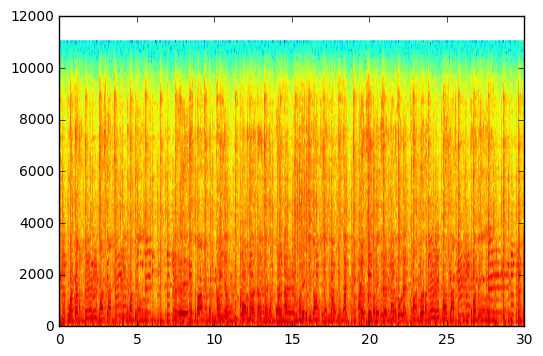

In [3]:
total_Frames=660000 # Only keep exactly 661000 frames.
# Convert all the data of one Au file to HEX format
sampleAu_data = np.fromstring(sampleAu.readframes(total_Frames), '>h')

# Generate a specgram of this Au file
specgram(sampleAu_data, Fs=sample_rate, xextent=(0,30))

In [4]:
Audio(sampleAu_data[0:30*sample_rate],rate=sample_rate)

/home/dc/anaconda3/envs/mxnet/lib/python2.7/site-packages/matplotlib/figure.py:397: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


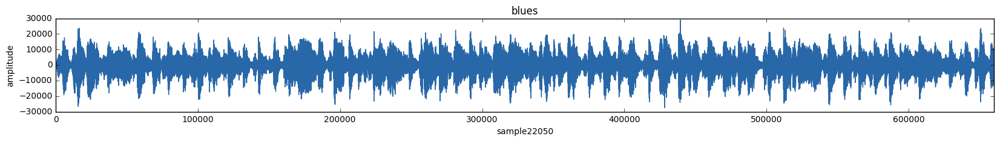

In [5]:
audiowave(sampleAu_data,sample_rate,genre_list,0)

We are using the MFCC algorithm to reduce features.
https://en.wikipedia.org/wiki/Mel-frequency_cepstrum

The number of features is reduced from 660,000 to 4124*13=53,612.
The wave chart of the sample after conversion shows more clear and simpler pattern.

(4124, 13) (4124, 40) (4124, 512)


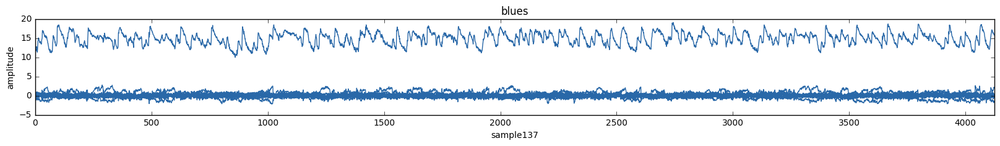

In [6]:
temp=mfcc(sampleAu_data)
print temp[0].shape, temp[1].shape, temp[2].shape

audiowave(temp[0],4124/30,genre_list,0)

Unfortuantely, the Audio function could not convert the data after MFCC into a audiable file.

In [7]:
Audio(temp[0][0:],rate=4124/30)

In [9]:
X,Y,XMFCC = read_sunau(genre_list)

(660000,) (1,) (660000,) (53612,) (53612,)
(2, 660000) (2, 1) (660000,) (2, 53612) (53612,)
(3, 660000) (3, 1) (660000,) (3, 53612) (53612,)
(4, 660000) (4, 1) (660000,) (4, 53612) (53612,)
(5, 660000) (5, 1) (660000,) (5, 53612) (53612,)
(6, 660000) (6, 1) (660000,) (6, 53612) (53612,)
(7, 660000) (7, 1) (660000,) (7, 53612) (53612,)
(8, 660000) (8, 1) (660000,) (8, 53612) (53612,)
(9, 660000) (9, 1) (660000,) (9, 53612) (53612,)
(10, 660000) (10, 1) (660000,) (10, 53612) (53612,)
(11, 660000) (11, 1) (660000,) (11, 53612) (53612,)
(12, 660000) (12, 1) (660000,) (12, 53612) (53612,)
(13, 660000) (13, 1) (660000,) (13, 53612) (53612,)
(14, 660000) (14, 1) (660000,) (14, 53612) (53612,)
(15, 660000) (15, 1) (660000,) (15, 53612) (53612,)
(16, 660000) (16, 1) (660000,) (16, 53612) (53612,)
(17, 660000) (17, 1) (660000,) (17, 53612) (53612,)
(18, 660000) (18, 1) (660000,) (18, 53612) (53612,)
(19, 660000) (19, 1) (660000,) (19, 53612) (53612,)
(20, 660000) (20, 1) (660000,) (20, 53612) (5

In [10]:
print X.shape, Y.shape, XMFCC.shape

(1000, 660000) (1000, 1) (1000, 53612)


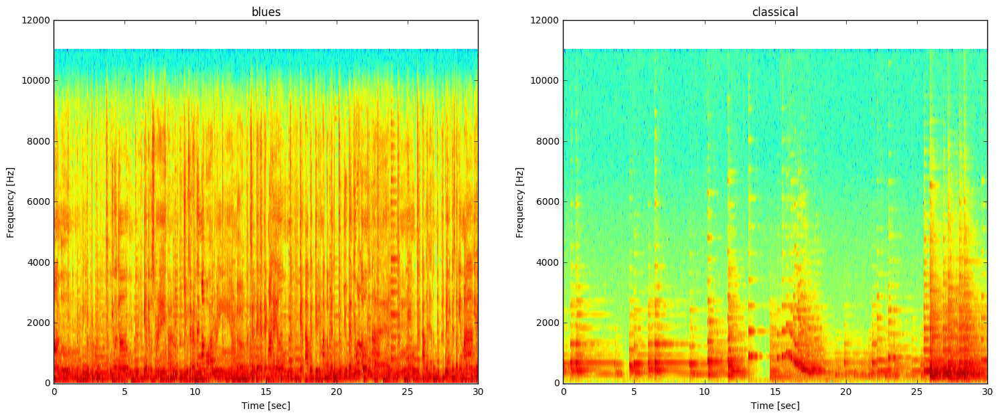

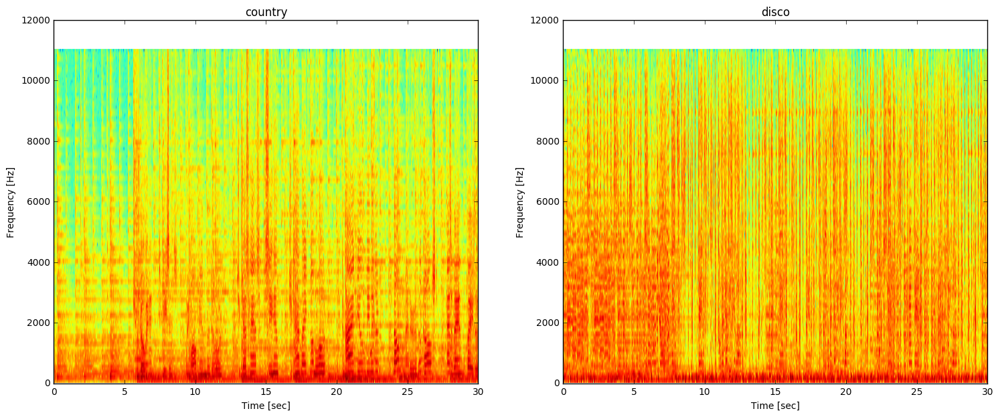

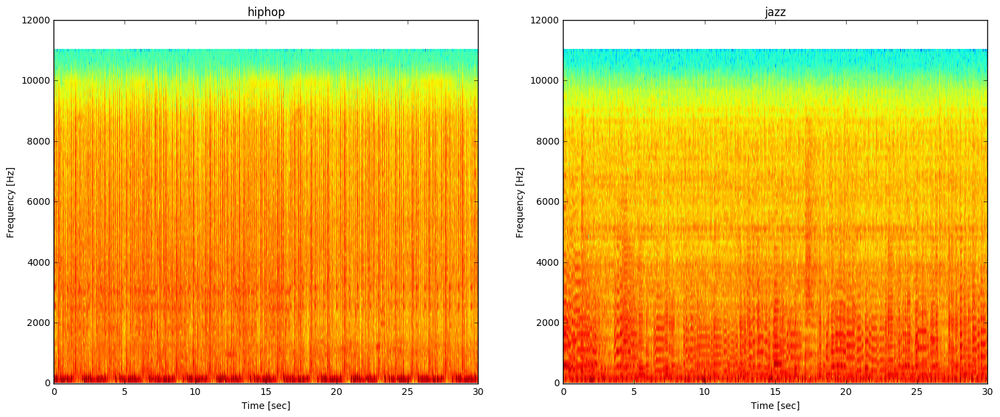

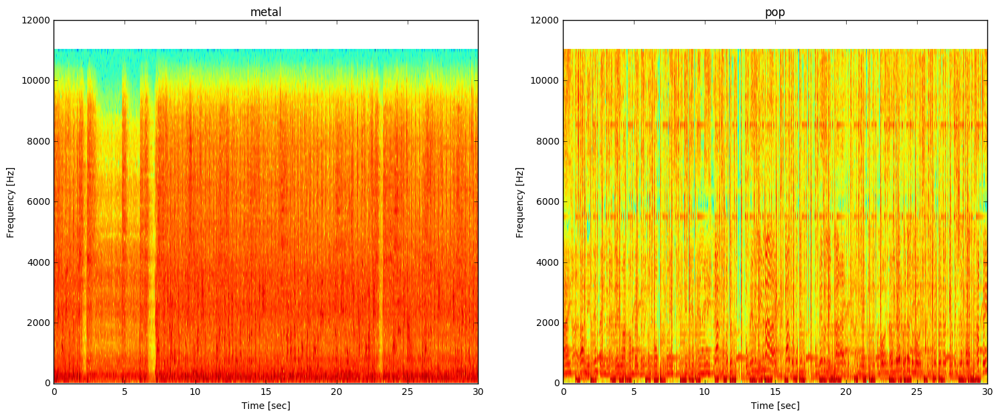

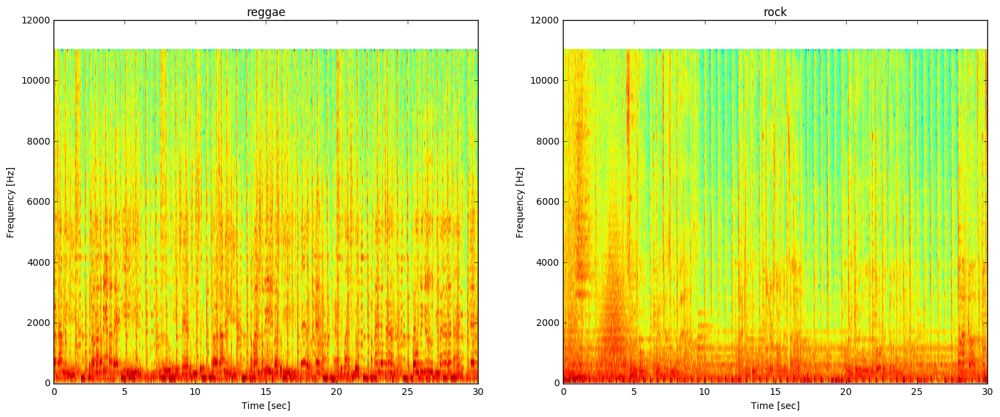

...

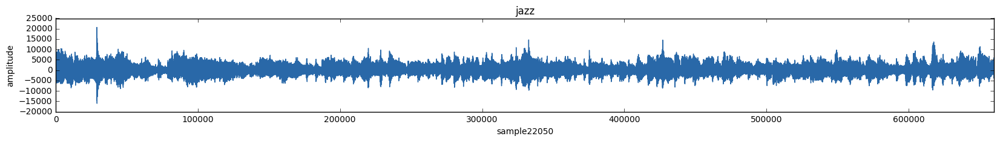

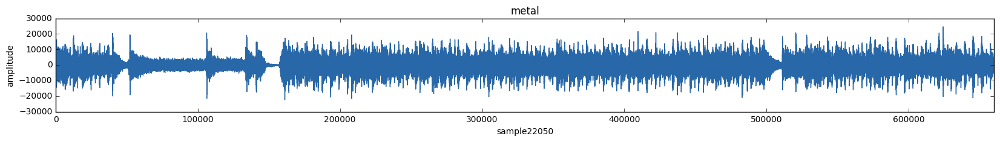

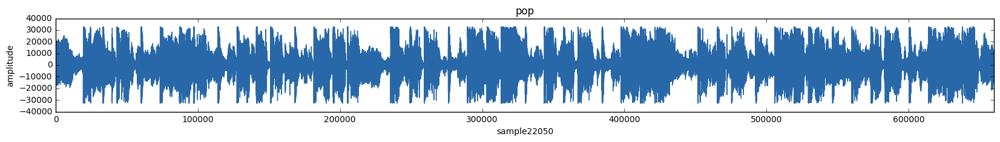

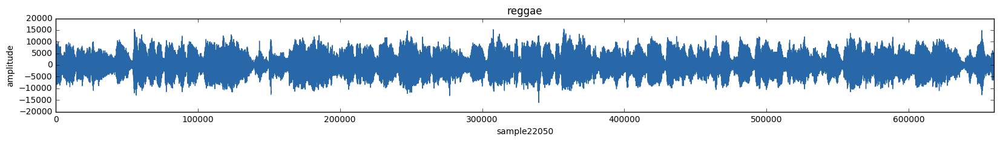

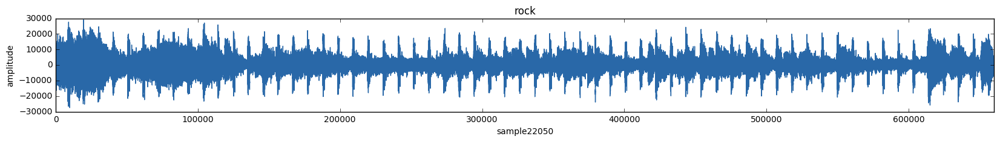

In [11]:
for i in range (1,900,200):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.specgram(X[i], Fs=sample_rate, xextent=(0,30))
    ax1.set_title(genre_list[int(i/100)])
    ax1.set_ylabel('Frequency [Hz]')
    ax1.set_xlabel('Time [sec]')
    ax2.specgram(X[i+100], Fs=sample_rate, xextent=(0,30))
    ax2.set_title(genre_list[int(i/100)+1])
    ax2.set_ylabel('Frequency [Hz]')
    ax2.set_xlabel('Time [sec]')
    plt.show()

for i in range (1,1000,100):
    audiowave(X[i],sample_rate,genre_list,int(i/100))

In [13]:
# Save X,XMFCC, and Y to a file.
raw_data=np.concatenate((X,XMFCC,Y),axis=1)
np.save('raw_data', raw_data)

# Stage 2: Deep Learning

In [14]:
raw_data.shape

(1000, 713613)

In [9]:
# Load raw_data from disk
raw_data=np.load('raw_data.npy')

In [10]:
raw_data.shape

(1000, 713613)

In [11]:
X=raw_data[:,range(0,660000)]
XMFCC=raw_data[:,range(660000,713612)]
Y=raw_data[:,[713612]]

In [12]:
Y=Y.ravel()
print X.shape, Y.shape, XMFCC.shape
Y=Y.astype(int)

(1000, 660000) (1000,) (1000, 53612)


After MFCC, some features have the nan or inf value. Remove these features.

In [13]:
XMFCC1=XMFCC
#remove features with na or inf
XMFCC=XMFCC[:,~np.isnan(XMFCC).any(axis=0)]
XMFCC=XMFCC[:,~np.isinf(XMFCC).any(axis=0)]
XMFCC.shape

(1000, 47866)

In [14]:
# SPlitting data set to train and test
X_train, X_test, Y_train, Y_test = cross_validation.train_test_split(
    XMFCC, Y, test_size=0.3, random_state=123)

In [15]:
print X_train.shape

(700, 47866)


In [16]:
data = mx.symbol.Variable(name="data") # Create sybmol data set

## 2.1 Train MFCC Data on Deep NN

Train a four layers deep network. (3682,3682,10,softmax).
It takes about 0.4s to run one epoch (training all 700 training samples once).
After 100 epoches, the accuracy of validation set is 0.3027

In [31]:
batch_size = 256
a=13;b=1;c=263*14
train_iter = mx.io.NDArrayIter(to4d(X_train,a,b,c), Y_train, batch_size, shuffle=True)
val_iter = mx.io.NDArrayIter(to4d(X_test,a,b,c), Y_test, batch_size)

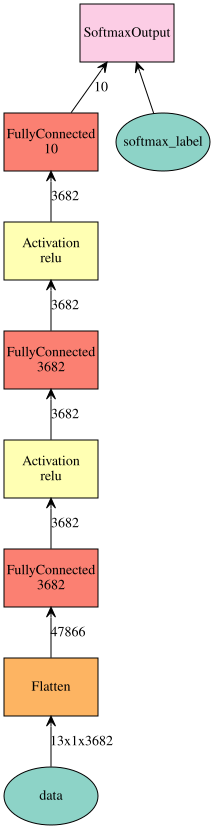

In [32]:
# Create a place holder variable for the input data
data = mx.sym.Variable('data')
# Flatten the data from 4-D shape (batch_size, num_channel, width, height) 
# into 2-D (batch_size, num_channel*width*height)
data = mx.sym.Flatten(data=data)

# The first fully-connected layer
fc1  = mx.sym.FullyConnected(data=data, name='fc1', num_hidden=263*14)
# Apply relu to the output of the first fully-connnected layer
act1 = mx.sym.Activation(data=fc1, name='relu1', act_type="relu")

# The second fully-connected layer and the according activation function
fc2  = mx.sym.FullyConnected(data=act1, name='fc2', num_hidden =263*14)
act2 = mx.sym.Activation(data=fc2, name='relu2', act_type="relu")

# The thrid fully-connected layer
fc3  = mx.sym.FullyConnected(data=act2, name='fc3', num_hidden=10)
# The softmax and loss layer
mlp  = mx.sym.SoftmaxOutput(data=fc3, name='softmax')

# We visualize the network structure with output size (the batch_size is ignored.)
shape = {"data" : (batch_size, a, b, c)}
mx.viz.plot_network(symbol=mlp, shape=shape)

In [19]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

model = mx.model.FeedForward(
    ctx = mx.gpu(0), 
    symbol = mlp,       # network structure
    num_epoch = 100,     # number of data passes for training 
    learning_rate = 0.001 # learning rate of SGD 
)
model.fit(
    X=train_iter,       # training data
    eval_data=val_iter, # validation data
    batch_end_callback = mx.callback.Speedometer(batch_size, 200) # output progress for each 200 data batches
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=2.722
INFO:root:Epoch[0] Validation-accuracy=0.097656
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=0.435
INFO:root:Epoch[1] Validation-accuracy=0.115234
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=0.438
INFO:root:Epoch[2] Validation-accuracy=0.125000
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=0.439
INFO:root:Epoch[3] Validation-accuracy=0.138672
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] Time cost=0.446
INFO:root:Epoch[4] Validation-accuracy=0.142578
INFO:root:Epoch[5] Resetting Data Iterator
INFO:root:Epoch[5] Time cost=0.443
INFO:root:Epoch[5] Validation-accuracy=0.144531
INFO:root:Epoch[6] Resetting Data Iterator
INFO:root:Epoch[6] Time cost=0.435
INFO:root:Epoch[6] Validation-accuracy=0.154297
INFO:root:Epoch[7] Resetting Data Iterator
INFO:root:Epoch[7] Time cost=0.443
I

# 2.2 Generating Specgram as new dataset
Since the result of both deep NN and CNN are not good for the data after MFCC. Bias is high. Let's try to use specgram to add more features. 

SOX is a very powerful tool to deal with audio files. It can generate specgram from audio files. FFT is used to generate the specgram. To save computation power, we only keeps one color channel, and 128 hz to take sample. Only 1s to 4s data is used to generate specgram.

In [28]:
#Create spectrogram
filename0='blues.00000.au'
currentPath = os.path.dirname(os.path.realpath(filename0))
filename=filename0.replace(".au","")
command = "sox '{}' -n spectrogram -Y 150 -X 50 -S 10 -d 3 -r -o '{}.png'".format(filename0,filename)
p = Popen(command, shell=True, stdin=PIPE, stdout=PIPE, stderr=STDOUT, close_fds=True, cwd='genres/blues/')
output, errors = p.communicate()

In [9]:
genre_list = ["blues","classical","country","disco","hiphop","jazz","metal","pop","reggae","rock"]
Y,png=generatepng (genre_list, root_dir='genres')

In [10]:
Xpng = np.asarray(png)
print Xpng.shape
print Y.shape

(1000, 129, 150)
(1000, 1)


In [11]:
# Save Xpng and Y.
np.save('png_data', Xpng)
np.save('Y_data',Y)

In [12]:
Xpng=np.load('png_data.npy')
Y=np.load('Y_data.npy')

In [13]:
Y=Y.ravel()
print Y.shape
Y=Y.astype(int)
Xpng=Xpng[:,0:128,0:128]
Xpng=to4d(Xpng,1,128,128)
print Xpng.shape


(1000,)
(1000, 1, 128, 128)


In [14]:
X_train1, X_test1, Y_train1, Y_test1 = cross_validation.train_test_split(
    Xpng, Y, test_size=0.3, random_state=123)

### 2.2.1 Train Specgram Data on Deep NN.
The Deep NN employed is a 6 layer Deep NN. (4096,4096,4096,4096,10,softmax).
It takes about 0.22s per epoch. (Training 700 training samples once). After 100 epoches, the accuracy is 0.318. Seems that Deep NN is not powerful enough to improve the accuracy. Let's explore CNN.

In [12]:
batch_size = 256
train_iter = mx.io.NDArrayIter(X_train1, Y_train1, batch_size, shuffle=True)
val_iter = mx.io.NDArrayIter(X_test1, Y_test1, batch_size)

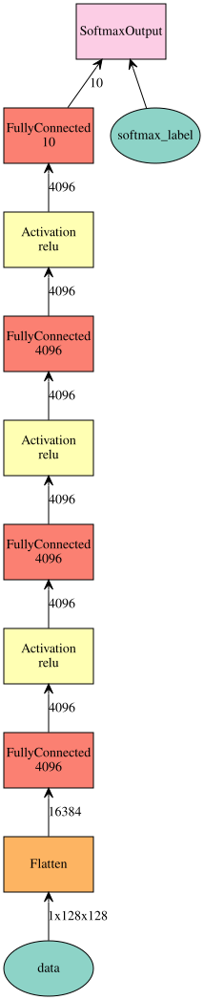

In [13]:
# Create a place holder variable for the input data
data = mx.sym.Variable('data')
# Flatten the data from 4-D shape (batch_size, num_channel, width, height) 
# into 2-D (batch_size, num_channel*width*height)
dataf = mx.sym.Flatten(data=data)

# The first fully-connected layer
fc1  = mx.sym.FullyConnected(data=dataf, name='fc1', num_hidden=4096)
# Apply relu to the output of the first fully-connnected layer
act1 = mx.sym.Activation(data=fc1, name='relu1', act_type="relu")

# The second fully-connected layer and the according activation function
fc2  = mx.sym.FullyConnected(data=act1, name='fc2', num_hidden =4096)
act2 = mx.sym.Activation(data=fc2, name='relu2', act_type="relu")

# The third fully-connected layer and the according activation function
fc3  = mx.sym.FullyConnected(data=act2, name='fc3', num_hidden =4096)
act3 = mx.sym.Activation(data=fc3, name='relu3', act_type="relu")

# The forth fully-connected layer and the according activation function
fc4  = mx.sym.FullyConnected(data=act3, name='fc4', num_hidden =4096)
act4 = mx.sym.Activation(data=fc4, name='relu4', act_type="relu")

# The fifth fully-connected layer, note that the hidden size should be 10, which is the number of unique digits
fc5  = mx.sym.FullyConnected(data=act3, name='fc5', num_hidden=10)
# The softmax and loss layer
mlp  = mx.sym.SoftmaxOutput(data=fc5, name='softmax')

# We visualize the network structure with output size (the batch_size is ignored.)
shape = {"data" : (batch_size, 1, 128, 128)}
mx.viz.plot_network(symbol=mlp, shape=shape)

In [14]:
X_train1.max() #Double check whether data loaded correctly

255.0

In [15]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

model = mx.model.FeedForward(
    ctx = mx.gpu(0), 
    symbol = mlp,       # network structure
    num_epoch = 200,     # number of data passes for training 
    learning_rate=0.00001
)
model.fit(
    X=train_iter,       # training data
    eval_data=val_iter, # validation data
    batch_end_callback = mx.callback.Speedometer(batch_size,3) # output progress for each 200 data batches
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [3]	Speed: 4260.42 samples/sec	Train-accuracy=0.093750
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=0.864
INFO:root:Epoch[0] Validation-accuracy=0.130859
INFO:root:Epoch[1] Batch [3]	Speed: 4491.91 samples/sec	Train-accuracy=0.114583
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=0.213
INFO:root:Epoch[1] Validation-accuracy=0.126953
INFO:root:Epoch[2] Batch [3]	Speed: 4404.68 samples/sec	Train-accuracy=0.127604
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=0.216
INFO:root:Epoch[2] Validation-accuracy=0.150391
INFO:root:Epoch[3] Batch [3]	Speed: 4417.15 samples/sec	Train-accuracy=0.140625
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=0.213
INFO:root:Epoch[3] Validation-accuracy=0.156250
INFO:root:Epoch[4] Batch [3]	Speed: 4464.47 samples/sec	Train-accuracy=0.148438
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoc

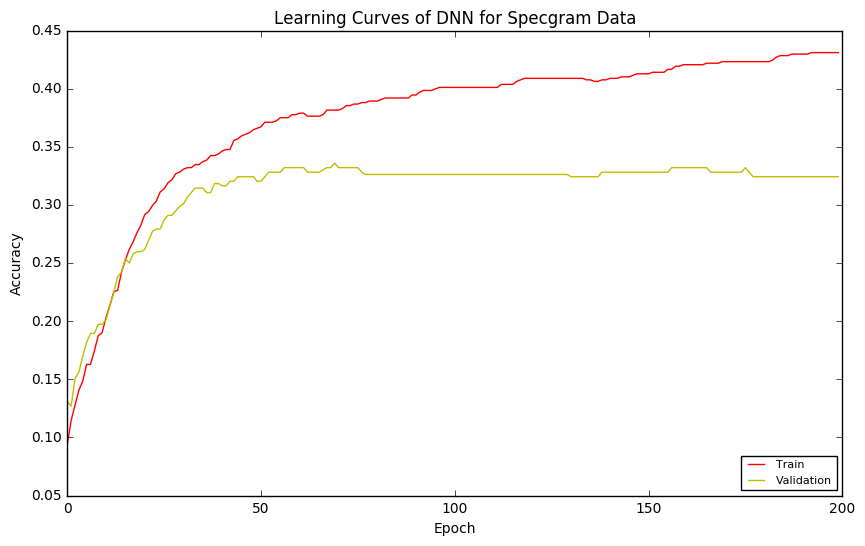

In [29]:
learning_curve('DNN-2',200,"Learning Curves of DNN for Specgram Data")

### 2.2.2 Training specgram on CNN

The CNN used here is a Recipe CNN, an Inception with Batch NormaliZation model. https://arxiv.org/abs/1502.03167.
One of the most advantage of this architecture is not sensitive to steps, and it converges relative fast to produce stabel results.
The model we used contains 24 layers.

In [12]:
batch_size = 128
train_iter = mx.io.NDArrayIter(X_train1, Y_train1, batch_size, shuffle=True)
val_iter = mx.io.NDArrayIter(X_test1, Y_test1, batch_size)

In [13]:
X_train1.shape

(700, 1, 128, 128)

In [14]:
data = mx.symbol.Variable(name="data")
conv1 = ConvFactory(data=data, kernel=(7,7), stride=(2, 2), num_filter=128, act_type="relu")
in3a = SimpleFactory(conv1, 64, 64)
in3b = SimpleFactory(in3a, 64, 96)
in3c = DownsampleFactory(in3b, 128)
in4a = SimpleFactory(in3c, 112,48)
in4b = SimpleFactory(in4a, 96, 64)
in4c = SimpleFactory(in4b, 80, 80)
in4d = SimpleFactory(in4c, 96, 96)
in4e = DownsampleFactory(in4c, 96)
in5a = SimpleFactory(in4e, 176, 160)
in5b = SimpleFactory(in5a, 176, 160)
pool = mx.symbol.Pooling(data=in5b, pool_type="avg", kernel=(11,11), name="global_avg")
flatten = mx.symbol.Flatten(data=pool)
fc = mx.symbol.FullyConnected(data=flatten, num_hidden=10)
softmax = mx.symbol.SoftmaxOutput(name='softmax',data=fc)

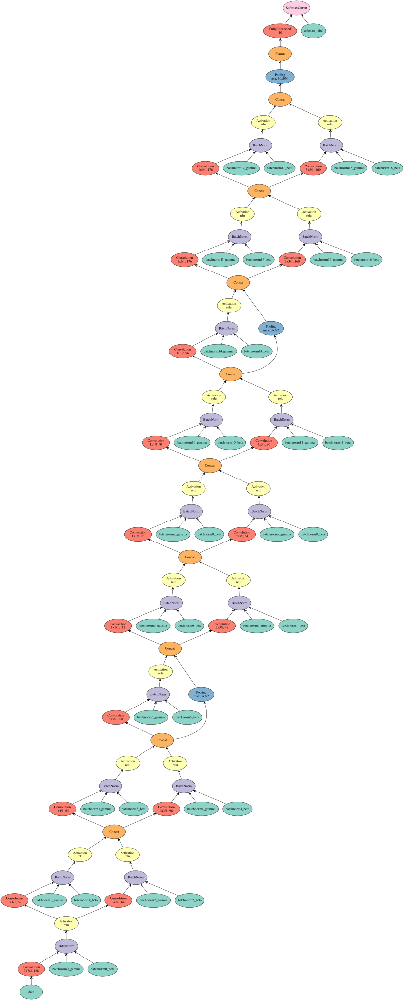

In [15]:
mx.viz.plot_network(symbol=softmax,node_attrs={'shape':'oval','fixedsize':'false'}) 

In [16]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=20
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.05, momentum=0.9, wd=0.00001)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 197.97 samples/sec	Train-accuracy=0.195312
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=4.104
INFO:root:Epoch[0] Validation-accuracy=0.114583
INFO:root:Epoch[1] Batch [6]	Speed: 198.62 samples/sec	Train-accuracy=0.246094
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=4.055
INFO:root:Epoch[1] Validation-accuracy=0.046875
INFO:root:Epoch[2] Batch [6]	Speed: 198.90 samples/sec	Train-accuracy=0.278646
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=4.062
INFO:root:Epoch[2] Validation-accuracy=0.085938
INFO:root:Epoch[3] Batch [6]	Speed: 198.35 samples/sec	Train-accuracy=0.316406
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=4.075
INFO:root:Epoch[3] Validation-accuracy=0.135417
INFO:root:Epoch[4] Batch [6]	Speed: 184.44 samples/sec	Train-accuracy=0.315104
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 

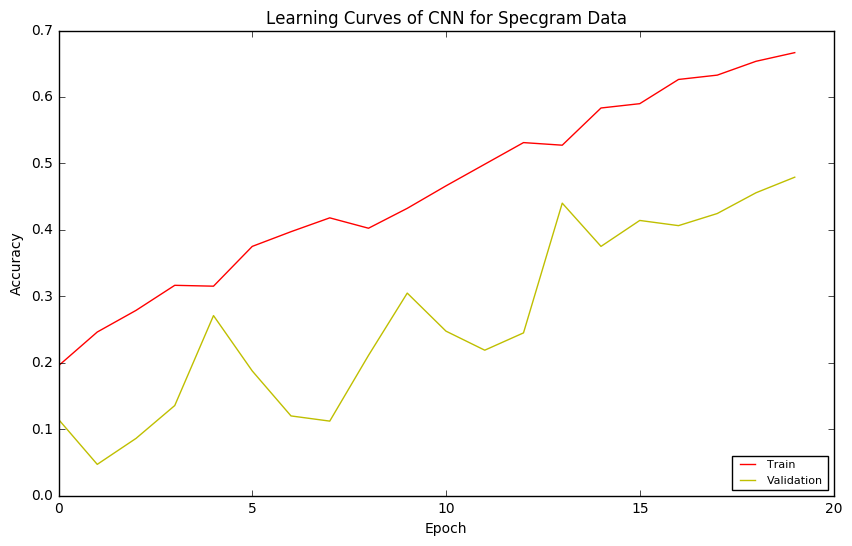

In [30]:
learning_curve('CNN-1',20,"Learning Curves of CNN for Specgram Data")

### Insufficient epoches
From the learning curve above, we found that the bias is still very hign, and both lines are increasing. Therefore, we can try more epoches. Let's use 50 epoches. 

In [15]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=50
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.05, momentum=0.9, wd=0.00001)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 198.47 samples/sec	Train-accuracy=0.123698
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=4.094
INFO:root:Epoch[0] Validation-accuracy=0.117188
INFO:root:Epoch[1] Batch [6]	Speed: 199.32 samples/sec	Train-accuracy=0.102865
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=4.059
INFO:root:Epoch[1] Validation-accuracy=0.104167
INFO:root:Epoch[2] Batch [6]	Speed: 195.73 samples/sec	Train-accuracy=0.195312
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=4.130
INFO:root:Epoch[2] Validation-accuracy=0.104167
INFO:root:Epoch[3] Batch [6]	Speed: 181.30 samples/sec	Train-accuracy=0.231771
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=4.442
INFO:root:Epoch[3] Validation-accuracy=0.080729
INFO:root:Epoch[4] Batch [6]	Speed: 198.38 samples/sec	Train-accuracy=0.247396
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 

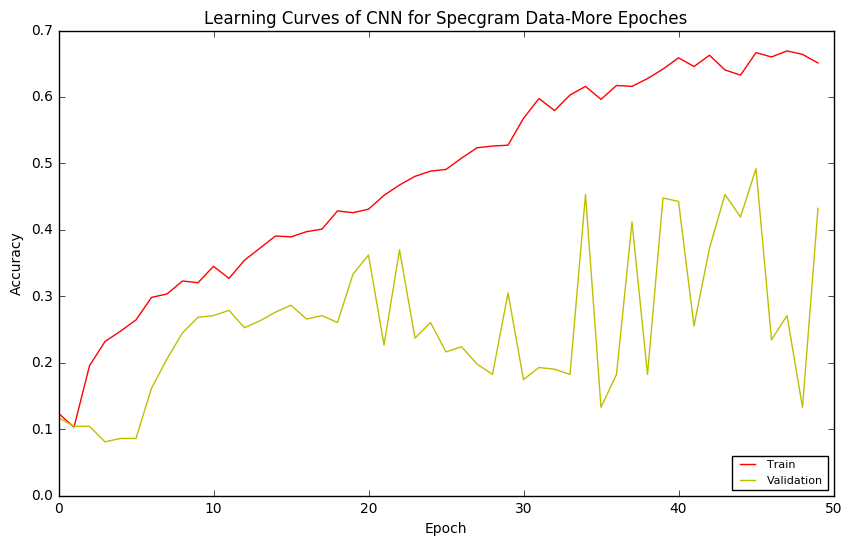

In [31]:
learning_curve('CNN-1_1',50,"Learning Curves of CNN for Specgram Data-More Epoches")

### Step is too large
The above chart impicates that the step might be boo large. Let's decrease it to 0.005.

In [34]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=50
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.005, momentum=0.9, wd=0.00001)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 199.91 samples/sec	Train-accuracy=0.240885
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=4.065
INFO:root:Epoch[0] Validation-accuracy=0.117188
INFO:root:Epoch[1] Batch [6]	Speed: 199.69 samples/sec	Train-accuracy=0.319010
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=4.050
INFO:root:Epoch[1] Validation-accuracy=0.106771
INFO:root:Epoch[2] Batch [6]	Speed: 199.09 samples/sec	Train-accuracy=0.386719
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=4.058
INFO:root:Epoch[2] Validation-accuracy=0.078125
INFO:root:Epoch[3] Batch [6]	Speed: 198.69 samples/sec	Train-accuracy=0.423177
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=4.068
INFO:root:Epoch[3] Validation-accuracy=0.088542
INFO:root:Epoch[4] Batch [6]	Speed: 198.91 samples/sec	Train-accuracy=0.447917
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 

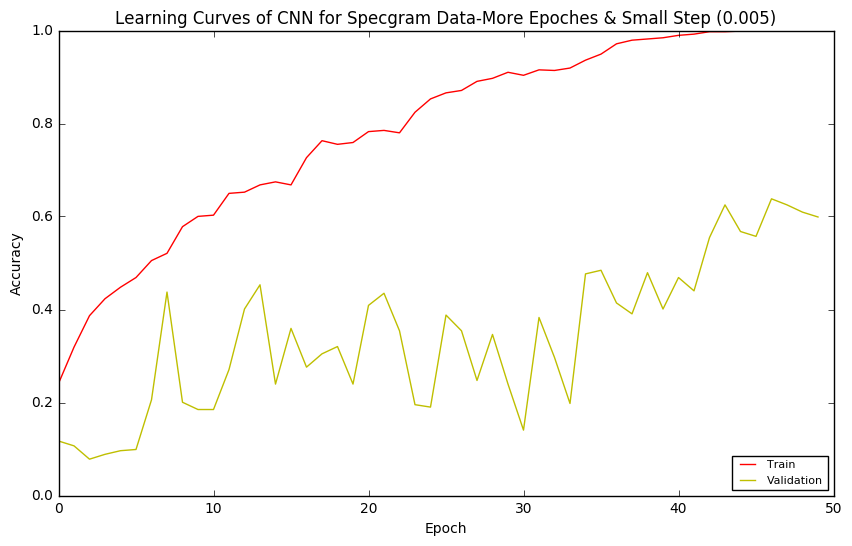

In [35]:
learning_curve('CNN-1_3',50,"Learning Curves of CNN for Specgram Data-More Epoches & Small Step (0.005)")

### Decrease step further
Let's try to use 0.0001 as the learning_rate.

In [36]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=50
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.0001, momentum=0.9, wd=0.00001)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 198.63 samples/sec	Train-accuracy=0.128906
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=4.091
INFO:root:Epoch[0] Validation-accuracy=0.117188
INFO:root:Epoch[1] Batch [6]	Speed: 194.51 samples/sec	Train-accuracy=0.282552
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=4.153
INFO:root:Epoch[1] Validation-accuracy=0.088542
INFO:root:Epoch[2] Batch [6]	Speed: 198.44 samples/sec	Train-accuracy=0.367188
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=4.075
INFO:root:Epoch[2] Validation-accuracy=0.078125
INFO:root:Epoch[3] Batch [6]	Speed: 196.86 samples/sec	Train-accuracy=0.402344
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=4.104
INFO:root:Epoch[3] Validation-accuracy=0.078125
INFO:root:Epoch[4] Batch [6]	Speed: 197.72 samples/sec	Train-accuracy=0.411458
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 

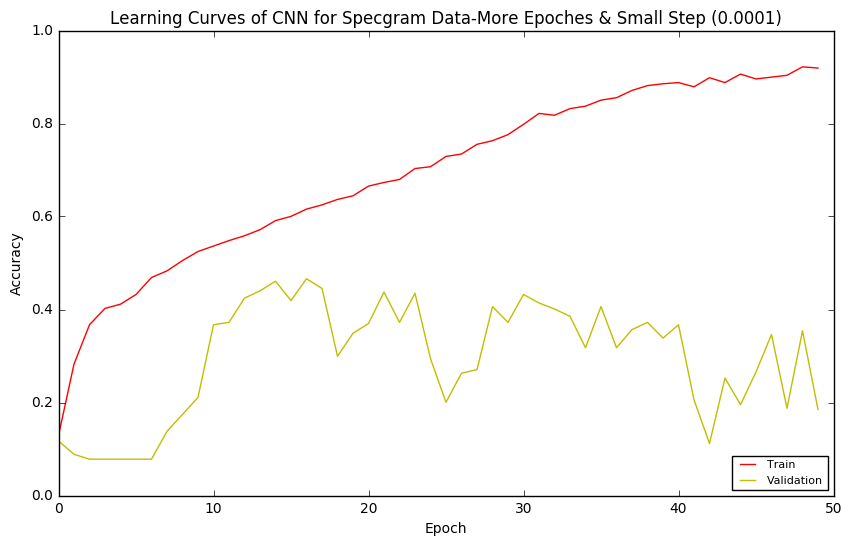

In [37]:
learning_curve('CNN-1_4',50,"Learning Curves of CNN for Specgram Data-More Epoches & Small Step (0.0001)")

### Learning rate is too low
Set it as 0.003, while increase epoches to 200

In [40]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=200
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.003, momentum=0.9, wd=0.00001)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 199.49 samples/sec	Train-accuracy=0.300781
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=4.076
INFO:root:Epoch[0] Validation-accuracy=0.080729
INFO:root:Epoch[1] Batch [6]	Speed: 194.98 samples/sec	Train-accuracy=0.351562
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=4.142
INFO:root:Epoch[1] Validation-accuracy=0.106771
INFO:root:Epoch[2] Batch [6]	Speed: 199.84 samples/sec	Train-accuracy=0.424479
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=4.049
INFO:root:Epoch[2] Validation-accuracy=0.078125
INFO:root:Epoch[3] Batch [6]	Speed: 197.60 samples/sec	Train-accuracy=0.462240
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=4.089
INFO:root:Epoch[3] Validation-accuracy=0.122396
INFO:root:Epoch[4] Batch [6]	Speed: 195.07 samples/sec	Train-accuracy=0.497396
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 

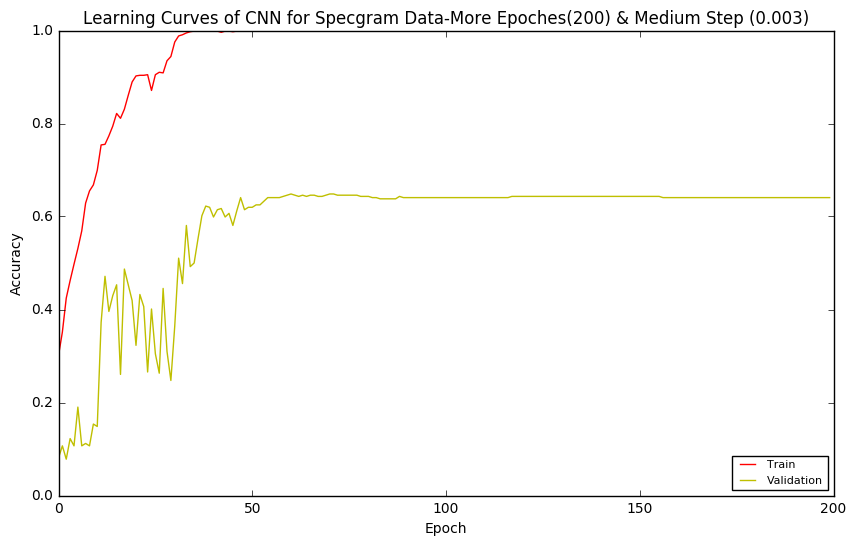

In [42]:
learning_curve('CNN-1_5',200, "Learning Curves of CNN for Specgram Data-More Epoches(200) & Medium Step (0.003)")

### Need a more complex model
Both curves become stable after 100 epoches, but the hige bias indicates that we may need a more complex model.
Let's use GoogleNet to train a model

In [15]:
batch_size = 64
train_iter = mx.io.NDArrayIter(X_train1, Y_train1, batch_size, shuffle=True)
val_iter = mx.io.NDArrayIter(X_test1, Y_test1, batch_size)

In [16]:
data = mx.symbol.Variable(name="data")
conv1 = ConvFactory(data=data, kernel=(3,3), stride=(2, 2), num_filter=128, act_type="relu")
in3a = SimpleFactory(conv1, 128, 128)
in3b = SimpleFactory(in3a, 128, 192)
in3c = DownsampleFactory(in3b, 256)
in4a = SimpleFactory(in3c, 224,96)
in4b = SimpleFactory(in4a, 196, 128)
in4c = SimpleFactory(in4b, 160, 160)
in4d = SimpleFactory(in4c, 192, 192)
in4e = DownsampleFactory(in4c, 192)
in5a = SimpleFactory(in4e, 354, 320)
in5b = SimpleFactory(in5a, 354, 320)
pool = mx.symbol.Pooling(data=in5b, pool_type="avg", kernel=(7,7), name="global_avg")
flatten = mx.symbol.Flatten(data=pool)
fc = mx.symbol.FullyConnected(data=flatten, num_hidden=10)
softmax = mx.symbol.SoftmaxOutput(name='softmax',data=fc)

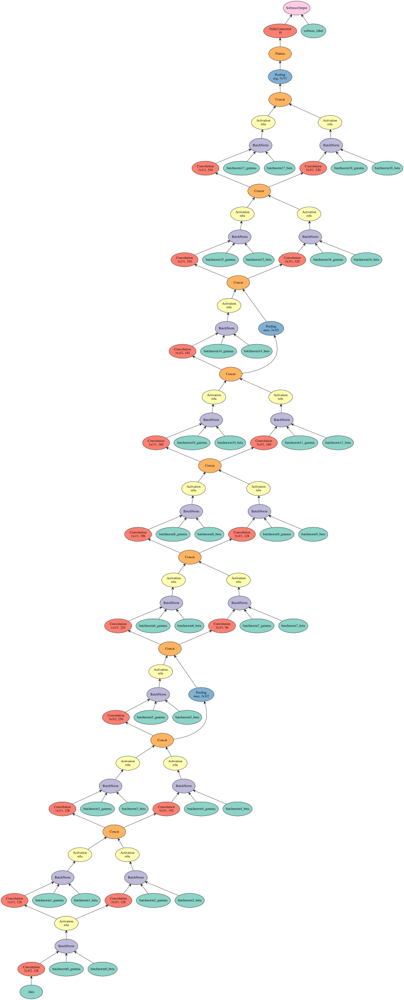

In [17]:
mx.viz.plot_network(symbol=softmax,node_attrs={'shape':'oval','fixedsize':'false'}) 

In [ ]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=10
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.01, momentum=0.8, wd=0.1)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 68.54 samples/sec	Train-accuracy=0.135417
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=11.271
INFO:root:Epoch[0] Validation-accuracy=0.115625
INFO:root:Epoch[1] Batch [6]	Speed: 70.78 samples/sec	Train-accuracy=0.164062
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=11.073
INFO:root:Epoch[1] Validation-accuracy=0.087500
INFO:root:Epoch[2] Batch [6]	Speed: 71.08 samples/sec	Train-accuracy=0.171875
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=11.123
INFO:root:Epoch[2] Validation-accuracy=0.118750
INFO:root:Epoch[3] Batch [6]	Speed: 68.62 samples/sec	Train-accuracy=0.226562
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=11.270
INFO:root:Epoch[3] Validation-accuracy=0.118750
INFO:root:Epoch[4] Batch [6]	Speed: 70.70 samples/sec	Train-accuracy=0.252604
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] T

GOOGLENET

In [75]:
data = mx.sym.Variable("data")
conv1 = ConvFactoryB(data, 128, kernel=(3, 3), stride=(2,2), pad=(3, 3), name="conv1")
pool1 = mx.sym.Pooling(conv1, kernel=(3, 3), stride=(2, 2), pool_type="max")
conv2 = ConvFactoryB(pool1, 64, kernel=(1, 1), stride=(1,1), name="conv2")
conv3 = ConvFactoryB(conv2, 192, kernel=(3, 3), stride=(1, 1), pad=(1,1), name="conv3")
pool3 = mx.sym.Pooling(conv3, kernel=(3, 3), stride=(2, 2), pool_type="max")

in3a = InceptionFactory(pool3, 64, 96, 128, 16, 32, "max", 32, name="in3a")
in3b = InceptionFactory(in3a, 128, 128, 192, 32, 96, "max", 64, name="in3b")
pool4 = mx.sym.Pooling(in3b, kernel=(3, 3), stride=(2, 2), pool_type="max")
in4a = InceptionFactory(pool4, 192, 96, 208, 16, 48, "max", 64, name="in4a")
in4b = InceptionFactory(in4a, 160, 112, 224, 24, 64, "max", 64, name="in4b")
in4c = InceptionFactory(in4b, 128, 128, 256, 24, 64, "max", 64, name="in4c")
in4d = InceptionFactory(in4c, 112, 144, 288, 32, 64, "max", 64, name="in4d")
in4e = InceptionFactory(in4d, 256, 160, 320, 32, 128, "max", 128, name="in4e")
pool5 = mx.sym.Pooling(in4e, kernel=(3, 3), stride=(2, 2), pool_type="max")
in5a = InceptionFactory(pool5, 256, 160, 320, 32, 128, "max", 128, name="in5a")
in5b = InceptionFactory(in5a, 384, 192, 384, 48, 128, "max", 128, name="in5b")
pool6 = mx.sym.Pooling(in5b, kernel=(2, 2), stride=(1,1), pool_type="avg")
flatten = mx.sym.Flatten(data=pool6)
loss3_classifier = mx.sym.FullyConnected(data=flatten, num_hidden=1000)
output=mx.sym.FullyConnected(data=flatten, num_hidden=10)
softmax = mx.symbol.SoftmaxOutput(data=fc1, name='softmax')

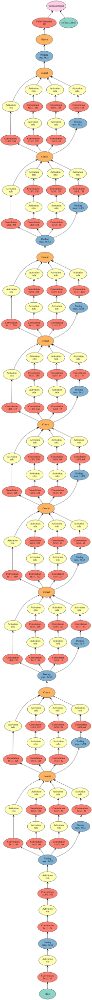

In [76]:
mx.viz.plot_network(symbol=softmax,node_attrs={'shape':'oval','fixedsize':'false'}) 

In [77]:
import logging
logging.getLogger().setLevel(logging.DEBUG)

num_epoch=10
model = mx.model.FeedForward(ctx=mx.gpu(), symbol=softmax, num_epoch=num_epoch,
                             learning_rate=0.01, momentum=0.8, wd=0.1)
model.fit(
    X=train_iter,  
    eval_data=val_iter, 
    batch_end_callback = mx.callback.Speedometer(batch_size, 6)
) 

INFO:root:Start training with [gpu(0)]
INFO:root:Epoch[0] Batch [6]	Speed: 734.42 samples/sec	Train-accuracy=0.100260
INFO:root:Epoch[0] Resetting Data Iterator
INFO:root:Epoch[0] Time cost=1.151
INFO:root:Epoch[0] Validation-accuracy=0.078125
INFO:root:Epoch[1] Batch [6]	Speed: 750.41 samples/sec	Train-accuracy=0.114583
INFO:root:Epoch[1] Resetting Data Iterator
INFO:root:Epoch[1] Time cost=1.103
INFO:root:Epoch[1] Validation-accuracy=0.078125
INFO:root:Epoch[2] Batch [6]	Speed: 710.87 samples/sec	Train-accuracy=0.114583
INFO:root:Epoch[2] Resetting Data Iterator
INFO:root:Epoch[2] Time cost=1.162
INFO:root:Epoch[2] Validation-accuracy=0.078125
INFO:root:Epoch[3] Batch [6]	Speed: 715.16 samples/sec	Train-accuracy=0.114583
INFO:root:Epoch[3] Resetting Data Iterator
INFO:root:Epoch[3] Time cost=1.154
INFO:root:Epoch[3] Validation-accuracy=0.078125
INFO:root:Epoch[4] Batch [6]	Speed: 708.51 samples/sec	Train-accuracy=0.114583
INFO:root:Epoch[4] Resetting Data Iterator
INFO:root:Epoch[4] 